In [1]:
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns



df = pd.read_csv('/kaggle/input/melbourne-housing-snapshot/melb_data.csv')

df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [2]:
df.dropna(inplace=True)

df.drop_duplicates(inplace=True)


In [3]:
df.isnull().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
YearBuilt        0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6196 entries, 1 to 12212
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         6196 non-null   object 
 1   Address        6196 non-null   object 
 2   Rooms          6196 non-null   int64  
 3   Type           6196 non-null   object 
 4   Price          6196 non-null   float64
 5   Method         6196 non-null   object 
 6   SellerG        6196 non-null   object 
 7   Date           6196 non-null   object 
 8   Distance       6196 non-null   float64
 9   Postcode       6196 non-null   float64
 10  Bedroom2       6196 non-null   float64
 11  Bathroom       6196 non-null   float64
 12  Car            6196 non-null   float64
 13  Landsize       6196 non-null   float64
 14  BuildingArea   6196 non-null   float64
 15  YearBuilt      6196 non-null   float64
 16  CouncilArea    6196 non-null   object 
 17  Lattitude      6196 non-null   float64
 18  Longtitude  

In [5]:
df.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,6196.000000,6.196000e+03,6196.000000,6196.000000,6196.000000,6196.000000,6196.000000,6196.000000,6196.000000,6196.000000,6196.000000,6196.000000,6196.000000
mean,2.931407,1.068828e+06,9.751097,3101.947708,2.902034,1.576340,1.573596,471.006940,141.568645,1964.081988,-37.807904,144.990201,7435.489509
std,0.971079,6.751564e+05,5.612065,86.421604,0.970055,0.711362,0.929947,897.449881,90.834824,38.105673,0.075850,0.099165,4337.698917
min,1.000000,1.310000e+05,0.000000,3000.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1196.000000,-38.164920,144.542370,389.000000
25%,2.000000,6.200000e+05,5.900000,3044.000000,2.000000,1.000000,1.000000,152.000000,91.000000,1940.000000,-37.855438,144.926198,4383.750000
50%,3.000000,8.800000e+05,9.000000,3081.000000,3.000000,1.000000,1.000000,373.000000,124.000000,1970.000000,-37.802250,144.995800,6567.000000
75%,4.000000,1.325000e+06,12.400000,3147.000000,3.000000,2.000000,2.000000,628.000000,170.000000,2000.000000,-37.758200,145.052700,10175.000000
max,8.000000,9.000000e+06,47.400000,3977.000000,9.000000,8.000000,10.000000,37000.000000,3112.000000,2018.000000,-37.457090,145.526350,21650.000000


In [6]:
# Assuming 'Price_Category' is derived from 'Price'

# Create 'Price_Category' column using pd.cut

import pandas as pd

import numpy as np

import plotly.express as px



# Define price bins and labels

bins = [0, 500000, 1000000, 1500000, 2000000, np.inf]  # Example bins

labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']





df['Price_Category'] = pd.cut(df['Price'], bins=bins, labels=labels)





fig = px.scatter(df,

                 x="Rooms", y="Price",

                 animation_frame="YearBuilt",

                 animation_group="BuildingArea",

                 size="Landsize",

                 color="Price_Category",

                 hover_name="Rooms",

                 log_x=False,

                 size_max=55,

                 range_x=[df['Rooms'].min(), df['Rooms'].max()],

                 range_y=[df['Price'].min(), df['Price'].max()],

                 labels={"Landsize": "Land Size", "Rooms": "Rooms", "Price": "Price"},

                 title="House Price Trends Over Time")



fig.show()

In [7]:
fig = px.scatter_mapbox(df,

                        lat="Lattitude",

                        lon="Longtitude",

                        color="Regionname",

                        zoom=10,

                        height=600)



fig.update_layout(mapbox_style="open-street-map")

fig.show()

In [8]:
df['BuildingArea'].fillna(df['BuildingArea'].mean(), inplace=True)





fig = px.scatter_mapbox(df,

                        lat="Lattitude",

                        lon="Longtitude",

                        color="Price",

                        size="BuildingArea",

                        hover_name="Rooms",

                        zoom=10,

                        height=600)



fig.update_layout(mapbox_style="open-street-map")

fig.show()

/tmp/ipykernel_17/53088064.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





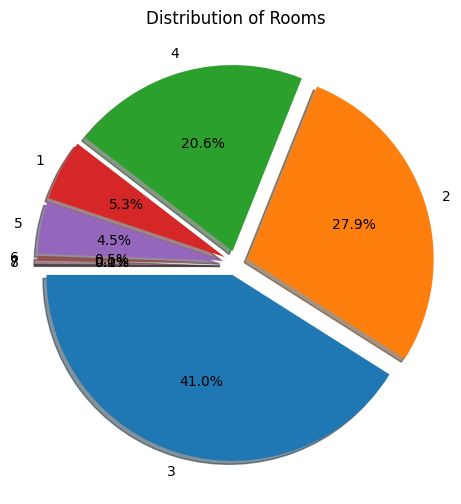

In [9]:
rooms_counts = df['Rooms'].value_counts()

rooms_labels = rooms_counts.index

plt.figure(figsize=(4, 6))

plt.axis("equal")

plt.pie(rooms_counts, labels=rooms_labels, shadow=True, autopct='%1.1f%%', radius=1.5, explode=[0.1] * len(rooms_labels), counterclock=True, startangle=180)

plt.title("Distribution of Rooms")

plt.show()






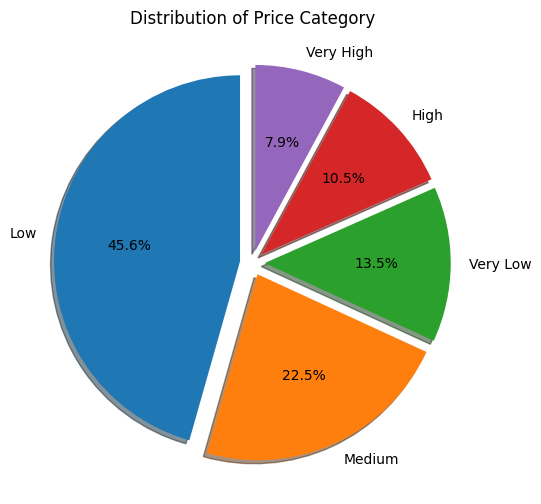

In [10]:
price_category_counts = df['Price_Category'].value_counts()

price_category_labels = price_category_counts.index

plt.figure(figsize=(4, 6))

plt.axis("equal")

plt.pie(price_category_counts, labels=price_category_labels, shadow=True, autopct='%1.1f%%', radius=1.5, explode=[0.1] * len(price_category_labels), counterclock=True, startangle=90)

plt.title("Distribution of Price Category")

plt.show()

In [11]:
if 'Price_Category' not in df.columns:



    df['Price_Category'] = pd.cut(df['Price'], bins=[0, 500000, 1000000, np.inf],

                                 labels=['Low', 'Medium', 'High'])

In [12]:
!pip install numba==0.53.1
!pip install ydata-profiling
!pip install visions --upgrade
!pip install ydata-profiling --upgrade

ERROR: Ignored the following versions that require a different python version: 0.52.0 Requires-Python >=3.6,<3.9; 0.52.0rc3 Requires-Python >=3.6,<3.9; 0.53.0 Requires-Python >=3.6,<3.10; 0.53.0rc1.post1 Requires-Python >=3.6,<3.10; 0.53.0rc2 Requires-Python >=3.6,<3.10; 0.53.0rc3 Requires-Python >=3.6,<3.10; 0.53.1 Requires-Python >=3.6,<3.10; 0.54.0 Requires-Python >=3.7,<3.10; 0.54.0rc2 Requires-Python >=3.7,<3.10; 0.54.0rc3 Requires-Python >=3.7,<3.10; 0.54.1 Requires-Python >=3.7,<3.10
ERROR: Could not find a version that satisfies the requirement numba==0.53.1 (from versions: 0.1, 0.2, 0.3, 0.5.0, 0.6.0, 0.7.0, 0.7.1, 0.7.2, 0.8.0, 0.8.1, 0.9.0, 0.10.0, 0.10.1, 0.11.0, 0.12.0, 0.12.1, 0.12.2, 0.13.0, 0.13.2, 0.13.3, 0.13.4, 0.14.0, 0.15.1, 0.16.0, 0.17.0, 0.18.1, 0.18.2, 0.19.1, 0.19.2, 0.20.0, 0.21.0, 0.22.0, 0.22.1, 0.23.0, 0.23.1, 0.24.0, 0.25.0, 0.26.0, 0.27.0, 0.28.1, 0.29.0, 0.30.0, 0.30.1, 0.31.0, 0.32.0, 0.33.0, 0.34.0, 0.35.0, 0.36.1, 0.36.2, 0.37.0, 0.38.0, 0.38.1, 0.39

In [13]:
from ydata_profiling import ProfileReport



profile = ProfileReport(df, title="Melbourne Housing Profile Report")

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
median_price = df['Price'].median()

df['Price_Category'] = (df['Price'] > median_price).astype(int)

In [15]:
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler





X = df[['Rooms', 'Distance', 'Bedroom2', 'Bathroom', 'Car', 'Landsize', 'BuildingArea', 'YearBuilt', 'Propertycount']]

y = df['Price_Category']





X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)





scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [16]:
from sklearn.linear_model import LogisticRegression





model = LogisticRegression(random_state=42)

model.fit(X_train, y_train)

LogisticRegression(random_state=42)

In [17]:
from sklearn.metrics import accuracy_score, classification_report





y_pred = model.predict(X_test)





accuracy = accuracy_score(y_test, y_pred)

report = classification_report(y_test, y_pred)



print(f"Accuracy: {accuracy}")

print(f"Classification Report:\n{report}")

Accuracy: 0.8185483870967742
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.81      0.82       629
           1       0.81      0.83      0.82       611

    accuracy                           0.82      1240
   macro avg       0.82      0.82      0.82      1240
weighted avg       0.82      0.82      0.82      1240



In [18]:
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import accuracy_score, classification_report





tree_classifier = DecisionTreeClassifier(random_state=42)



tree_classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [19]:
y_pred = tree_classifier.predict(X_test)





accuracy = accuracy_score(y_test, y_pred)

report = classification_report(y_test, y_pred)



print(f"Accuracy: {accuracy}")

print(f"Classification Report:\n{report}")

Accuracy: 0.8088709677419355
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.79      0.81       629
           1       0.79      0.82      0.81       611

    accuracy                           0.81      1240
   macro avg       0.81      0.81      0.81      1240
weighted avg       0.81      0.81      0.81      1240

